<a href="https://colab.research.google.com/github/Mr-Shubham-Patel/Credit-Card-Default-Prediction/blob/main/Credit_Card_Default_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - 



##### **Project Type**    - Classification
##### **Contribution**    - Team
##### **Team Member 1 -**  Patel Shubham
##### **Team Member 2 -**Patel Jay


# **Project Summary -**


The Credit Card Default Prediction project aimed to develop a machine learning model to predict whether a credit card holder will default on their payment next month. The project involved several steps, including data preprocessing, exploratory data analysis, model selection, and model evaluation.

The dataset used for the project contained various features related to credit card holders, such as their payment history, bill amounts, and demographic information. The target variable was a binary indicator of whether the customer defaulted on their payment in the following month.

The project began with Exploratory data analysis was performed to gain insights into the data, understand feature distributions, and identify any patterns or correlations. data preprocessing, which involved handling missing values, encoding categorical variables, and scaling numerical features. Exploratory data analysis was performed to gain insights into the data, understand feature distributions, and identify any patterns or correlations.

Next, several machine learning models were trained and evaluated on the dataset. The models considered included Logistic Regression (LR), Random Forest (RF), Decision Tree (DT), K-Nearest Neighbors (KNN), XGBoost (XGB), and Support Vector Machine (SVM). Hyperparameter tuning was also performed for some models to optimize their performance.

The models were evaluated using various performance metrics, including accuracy, F1 score, precision, recall, and ROC AUC score. Additionally, undersampling techniques were applied to address the class imbalance issue in the dataset.

# **GitHub Link -**

https://github.com/Mr-Shubham-Patel/Credit-Card-Default-Prediction.git

# **Problem Statement**


**The main objective of this project is to build a reliable predictive model that can accurately classify credit card holders as either likely to default or not likely to default on their payment next month.**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
# Basic
import numpy as np
import pandas as pd

# Plotation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
%matplotlib inline

# ML Models
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

# Evaluation Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import log_loss
from sklearn.metrics import classification_report

# Hyper Parameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Miscellaneous
import time
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
# Load Dataset
Data = ('https://raw.githubusercontent.com/Mr-Shubham-Patel/Credit-Card-Default-Prediction/main/default%20of%20credit%20card%20clients.xls%20-%20Data.csv')
Df_CCDP= pd.read_csv(Data,encoding='ISO-8859-1')

### Dataset First View

In [ ]:
# Dataset First Look
Df_CCDP

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
Rows = Df_CCDP.shape[0]
Columns=Df_CCDP.shape[1]
print(f"The number of rows is {Rows} and number of columns is {Columns}")

The number of rows is 30000 and number of columns is 25


### Dataset Information

In [ ]:
# Dataset Info
Df_CCDP.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value 
duplicates =len(Df_CCDP[Df_CCDP.duplicated()])
print(duplicates)

0


*   There is no duplicate value.

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
Df_CCDP.isna().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default payment next month    0
dtype: int64

*   As we can see there are no null values present in our dataset.

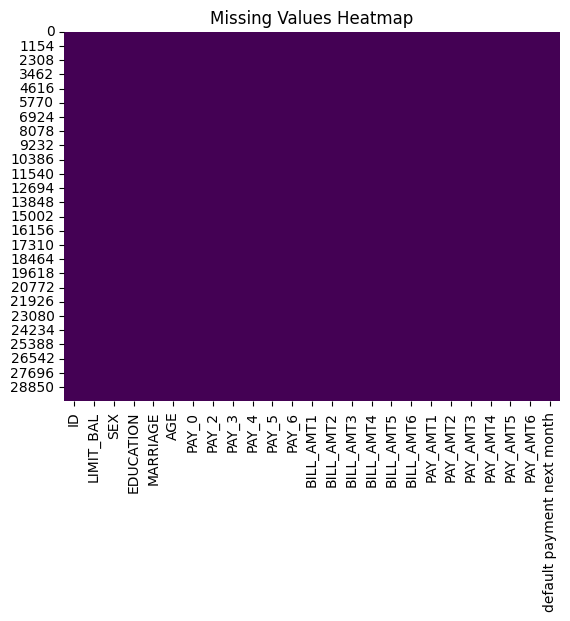

In [ ]:
# Visualizing the missing values
# Plot the missing values as a heatmap
sns.heatmap(Df_CCDP.isnull(), cmap='viridis', cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

### What did you know about your dataset?



*   In our dataset there is 30000 raws and 25 columns. 
*   There is no null value and no duplicate value in our dataset.








## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
print(list(Df_CCDP.columns))

['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'default payment next month']


In [ ]:
# Dataset Describe
Df_CCDP.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
ID,30000.0,15000.500000,8660.398374,1.0,7500.75,15000.5,22500.25,30000.0
LIMIT_BAL,30000.0,167484.322667,129747.661567,10000.0,50000.00,140000.0,240000.00,1000000.0
SEX,30000.0,1.603733,0.489129,1.0,1.00,2.0,2.00,2.0
EDUCATION,30000.0,1.853133,0.790349,0.0,1.00,2.0,2.00,6.0
MARRIAGE,30000.0,1.551867,0.521970,0.0,1.00,2.0,2.00,3.0
AGE,30000.0,35.485500,9.217904,21.0,28.00,34.0,41.00,79.0
PAY_0,30000.0,-0.016700,1.123802,-2.0,-1.00,0.0,0.00,8.0
PAY_2,30000.0,-0.133767,1.197186,-2.0,-1.00,0.0,0.00,8.0
PAY_3,30000.0,-0.166200,1.196868,-2.0,-1.00,0.0,0.00,8.0
PAY_4,30000.0,-0.220667,1.169139,-2.0,-1.00,0.0,0.00,8.0


### Variables Description 

 - **ID**: ID of each client
 - **LIMIT_BAL**: Amount of given credit in NT dollars (includes individual and family/supplementary credit
 - **SEX**: Gender (1=male, 2=female)
 - **EDUCATION**: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
 - **MARRIAGE**: Marital status (1=married, 2=single, 3=others)
 - **AGE**: Age in years
 - **PAY_0**: Repayment status  (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, … 8=payment delay for eight months, 9=payment delay for nine months and above)
 - **PAY_2**: Repayment status (scale same as above)
 - **PAY_3**: Repayment status (scale same as above)
 - **PAY_4**: Repayment status (scale same as above)
 - **PAY_5**: Repayment status (scale same as above)
 - **PAY_6**: Repayment status (scale same as above)
 - **BILL_AMT1**: Amount of bill statement (NT dollar)
 - **BILL_AMT2**: Amount of bill statement (NT dollar)
 - **BILL_AMT3**: Amount of bill statement (NT dollar)
 - **BILL_AMT4**: Amount of bill statement (NT dollar)
 - **BILL_AMT5**: Amount of bill statement (NT dollar)
 - **BILL_AMT6**: Amount of bill statement (NT dollar)
 - **PAY_AMT1**: Amount of previous payment (NT dollar)
 - **PAY_AMT2**: Amount of previous payment (NT dollar)
 - **PAY_AMT3**: Amount of previous payment (NT dollar)
 - **PAY_AMT4**: Amount of previous payment (NT dollar)
 - **PAY_AMT5**: Amount of previous payment (NT dollar)
 - **PAY_AMT6**: Amount of previous payment (NT dollar)
 - **default.payment.next.month**: Default payment (1=yes, 0=no)

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
Df_CCDP.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default payment next month        2
dtype: int64

In [ ]:
variables_df = Df_CCDP.columns.to_list()
for i in variables_df:
  print('The Unique Values of', i, 'are:', Df_CCDP[i].unique())

The Unique Values of ID are: [    1     2     3 ... 29998 29999 30000]
The Unique Values of LIMIT_BAL are: [  20000  120000   90000   50000  500000  100000  140000  200000  260000
  630000   70000  250000  320000  360000  180000  130000  450000   60000
  230000  160000  280000   10000   40000  210000  150000  380000  310000
  400000   80000  290000  340000  300000   30000  240000  470000  480000
  350000  330000  110000  420000  170000  370000  270000  220000  190000
  510000  460000  440000  410000  490000  390000  580000  600000  620000
  610000  700000  670000  680000  430000  550000  540000 1000000  530000
  710000  560000  520000  750000  640000   16000  570000  590000  660000
  720000  327680  740000  800000  760000  690000  650000  780000  730000]
The Unique Values of SEX are: [2 1]
The Unique Values of EDUCATION are: [2 1 3 5 4 6 0]
The Unique Values of MARRIAGE are: [1 2 3 0]
The Unique Values of AGE are: [24 26 34 37 57 29 23 28 35 51 41 30 49 39 40 27 47 33 32 54 58 22 25 31

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.
Df_CCDP.set_index('ID', inplace = True)
Df_CCDP.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
ID,,,,,,,,,,,,,,,,,,,,,
1,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
2,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [ ]:
# Change column names "PAY_0" to 'PAY_1', 'default.payment.next.month'to 'D_P_N_M'

Df_CCDP.rename(columns={'PAY_0':'PAY_1','default payment next month':'D_P_N_M'},inplace = True)
Df_CCDP.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'D_P_N_M'],
      dtype='object')

**In Education column The categories 4:others, 5:unknown, and 6:unknown can be grouped into a single class '4'**

In [ ]:
Df_CCDP['EDUCATION'].unique()

array([2, 1, 3, 5, 4, 6, 0])

In [ ]:
#convert education category 5,6,0 to 4.
Df_CCDP['EDUCATION']=np.where(Df_CCDP['EDUCATION'] == 5, 4, Df_CCDP['EDUCATION'])
Df_CCDP['EDUCATION']=np.where(Df_CCDP['EDUCATION'] == 6, 4, Df_CCDP['EDUCATION'])
Df_CCDP['EDUCATION']=np.where(Df_CCDP['EDUCATION'] == 0, 4, Df_CCDP['EDUCATION'])

In [ ]:
#After grouping, the education column has the following categories
Df_CCDP['EDUCATION'].unique()

array([2, 1, 3, 4])

**In column 'marriage' should have three categories: 1 = married, 2 = single, 3 = others but it contains a category '0' which will be joined to the category '3'**

In [ ]:
Df_CCDP['MARRIAGE']=np.where(Df_CCDP['MARRIAGE'] == 0, 3, Df_CCDP['MARRIAGE'])
Df_CCDP['MARRIAGE'].unique()

array([1, 2, 3])

In [ ]:
#creating list of numerical and categorical columns
numerical_columns=[]
for col in Df_CCDP.columns:
  if Df_CCDP[col].nunique()>5:
    numerical_columns.append(col)
categorical_columns=list(set(Df_CCDP.columns)-set(numerical_columns))

In [ ]:
print(numerical_columns)

['LIMIT_BAL', 'AGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']


In [ ]:
print(categorical_columns)

['EDUCATION', 'MARRIAGE', 'D_P_N_M', 'SEX']


### What all manipulations have you done and insights you found?



*   First i have check unique value for all the column. than set index as 'ID'.

*    Change column names "PAY_0" to 'PAY_1', 'default.payment.next.month'to 'D_P_N_M' ,convert education category 5,6,0 to 4.

*  In column 'marriage' should have three categories: 1 = married, 2 = single, 3 = others but it contains a category '0' which will be joined to the category '3'







## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

How is the distribution of credit limit (LIMIT_BAL) among clients?

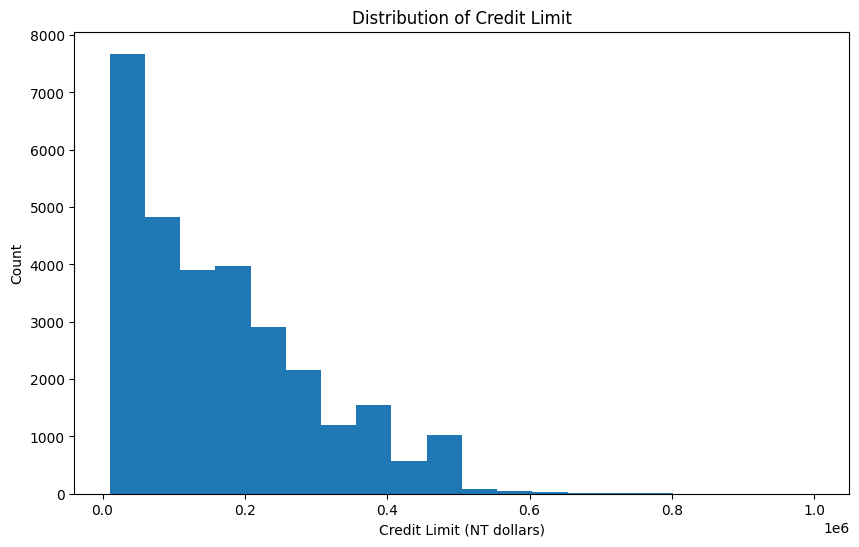

In [ ]:
# Chart - 1 visualization code
plt.figure(figsize=(10, 6))
plt.hist(Df_CCDP['LIMIT_BAL'], bins=20)
plt.xlabel('Credit Limit (NT dollars)')
plt.ylabel('Count')
plt.title('Distribution of Credit Limit')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a histogram because it is suitable for visualizing the distribution of a continuous variable




##### 2. What is/are the insight(s) found from the chart?



*   The majority of clients have a credit limit between 0 and 500,000 NT dollars, as indicated by the highest bar in the histogram.


*  The distribution appears to be right-skewed, with a long tail towards higher credit limits.

*  There are relatively fewer clients with very high credit limits above 500,000 NT dollars.






##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   Overall, the gained insights from the chart can positively impact the business by enabling credit card issuers to make informed decisions regarding credit limits and enhance their risk management strategies.




#### Chart - 2

What is the percentage of male and female clients (SEX)?

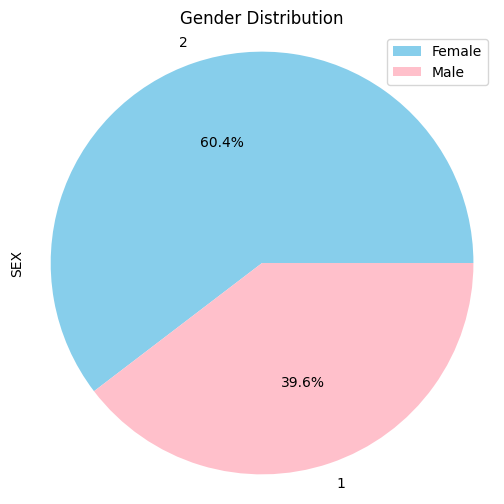

In [ ]:
# Chart - 2 visualization code
plt.figure(figsize=(6, 6))
Df_CCDP['SEX'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['skyblue', 'pink'])
plt.axis('equal')
plt.title('Gender Distribution')
plt.legend(['Female', 'Male'])
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a pie chart because it is suitable for visualizing the composition or distribution of categorical data, in this case, the gender distribution (SEX) among clients.




##### 2. What is/are the insight(s) found from the chart?



*   The chart shows the percentage of male is 39.6% and female is 60.4% clients in the dataset.




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*  Overall, the gained insights from the chart can positively impact the business by enabling credit card issuers to better understand their customer base and tailor their strategies accordingly. It is essential to ensure fairness, inclusivity, and compliance with regulations to maintain positive business growth and reputation.




#### Chart - 3

How does the education level (EDUCATION) vary among clients?

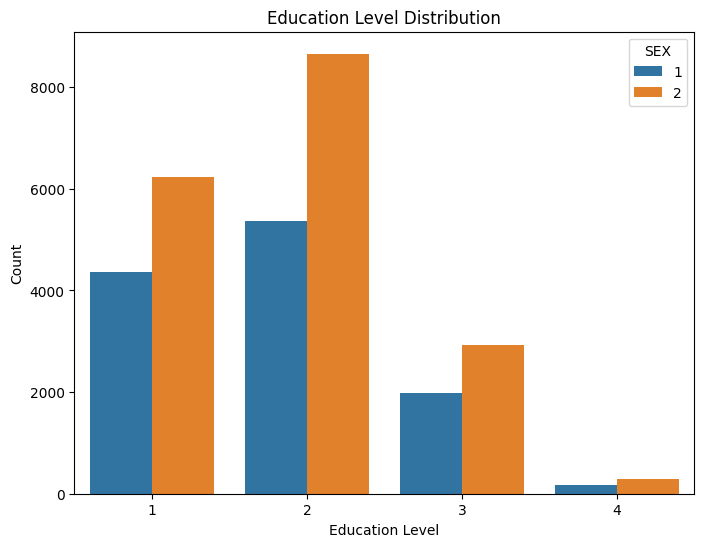

In [ ]:
# Chart - 3 visualization code
plt.figure(figsize=(8, 6))
sns.countplot(data=Df_CCDP, x='EDUCATION', hue='SEX')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.title('Education Level Distribution')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a countplot because it effectively displays the distribution of categorical data, specifically the education level (EDUCATION), while also incorporating the gender (SEX) as a hue. 

##### 2. What is/are the insight(s) found from the chart?



*   The chart displays the distribution of education levels among clients, categorized by gender.


*  The x-axis represents different education levels, such as graduate school(1), university(2), high school(3) amd other(4) etc.

*  The y-axis represents the count or frequency of clients in each education level.






##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   The insights gained from the chart can help credit card issuers understand the education level distribution among their clients.


*  This understanding can inform business decisions such as targeted marketing campaigns, product design, and customer support services.
By analyzing the education level distribution, credit card issuers can identify trends and preferences among different education groups.

#### Chart - 4

What is the marital status (MARRIAGE) distribution among clients?

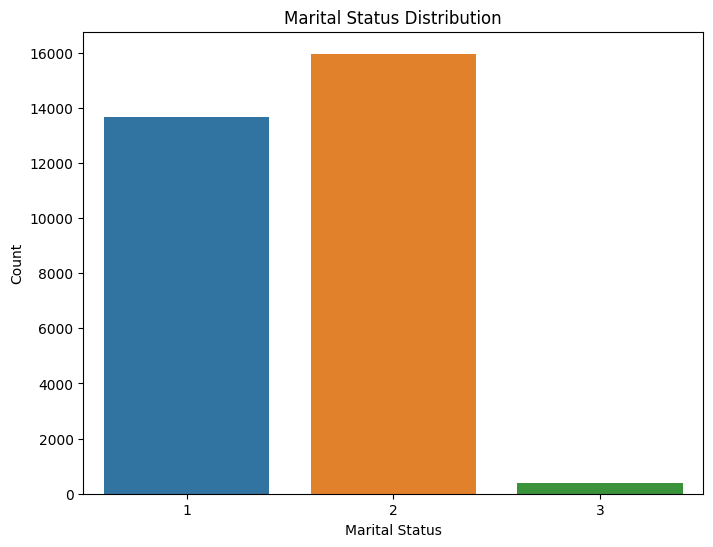

In [ ]:
# Chart - 4 visualization code
plt.figure(figsize=(8, 6))
sns.countplot(data=Df_CCDP, x='MARRIAGE')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.title('Marital Status Distribution')
plt.show()

##### 1. Why did you pick the specific chart?



*  
The specific chart chosen is a countplot because it effectively displays the distribution of categorical data, specifically the marital status (MARRIAGE) among clients.

##### 2. What is/are the insight(s) found from the chart?



*  The chart displays the distribution of marital status among clients.



*  The x-axis represents different marital status categories, such as married(1), single(2) and other(3).
* The y-axis represents the count or frequency of clients in each marital status category.




##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*  By analyzing the marital status distribution, credit card issuers can identify trends and preferences among different marital status groups.

*   This information can be used to tailor credit card features, benefits, and rewards that align with the specific needs and financial goals of each marital status segment.



#### Chart - 5

How is the age (AGE) distribution of clients?

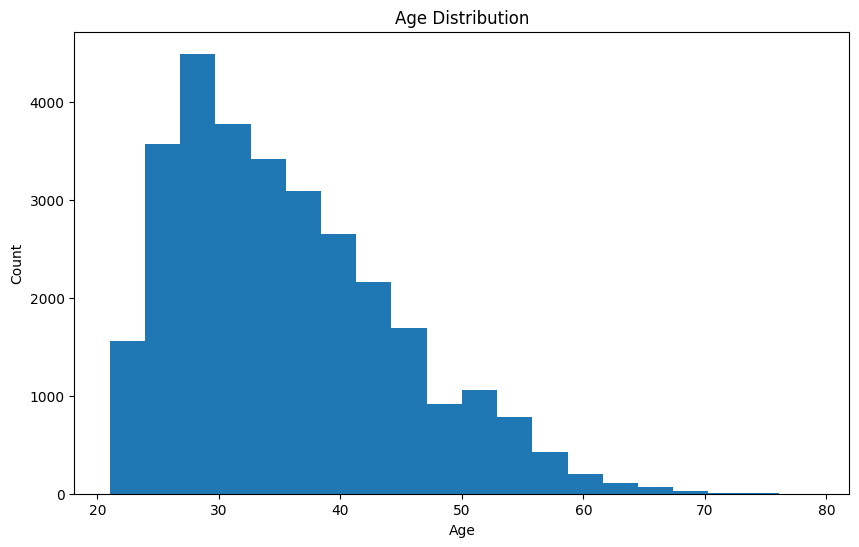

In [ ]:
# Chart - 5 visualization code
plt.figure(figsize=(10, 6))
plt.hist(Df_CCDP['AGE'], bins=20)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age Distribution')
plt.show()

##### 1. Why did you pick the specific chart?



* The specific chart chosen is a histogram because it effectively displays the distribution of continuous data, specifically the age (AGE) of clients. 

##### 2. What is/are the insight(s) found from the chart?



*  The chart displays the distribution of ages among clients.


*  The x-axis represents different age intervals or bins.

* The y-axis represents the count or frequency of clients falling within each age interval.






##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   Understanding the age distribution can also aid in developing personalized financial planning tools, budgeting apps, or retirement savings solutions for specific age groups.



*   It can assist in identifying potential life-stage milestones, such as first-time credit card applicants, young professionals, families, or retirees, and tailor offerings accordingly.



*   By catering to the diverse age groups, credit card issuers can enhance customer satisfaction, engagement, and loyalty.





#### Chart - 6

How do the repayment statuses (PAY_0 to PAY_6) vary among clients?

<Figure size 1000x600 with 0 Axes>

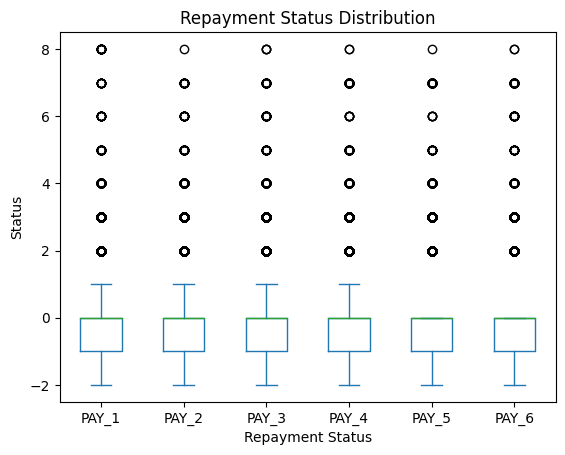

In [ ]:
# Chart - 6 visualization code
plt.figure(figsize=(10, 6))
Df_CCDP[['PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']].plot(kind='box')
plt.xlabel('Repayment Status')
plt.ylabel('Status')
plt.title('Repayment Status Distribution')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a box plot because it effectively displays the distribution and variation of repayment statuses (PAY_0 to PAY_6) among clients. 




##### 2. What is/are the insight(s) found from the chart?



*   The chart displays box plots for the repayment statuses of clients across multiple time periods.

*  Each box plot represents the distribution of repayment statuses for a specific time period.

*  The boxes in the plot represent the interquartile range (IQR), which contains the middle 50% of the data.
*   Any points beyond the whiskers are considered outliers.





##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   Overall, the gained insights from the chart can positively impact the business by enabling credit card issuers to assess repayment behavior, identify risk patterns, and tailor strategies to mitigate credit risk.
*  However, it is crucial to actively manage and address clients with consistently negative repayment statuses or outliers to prevent negative growth and ensure the financial health of the portfolio.



#### Chart - 7

What is the distribution of bill amounts (BILL_AMT1 to BILL_AMT6) among clients?

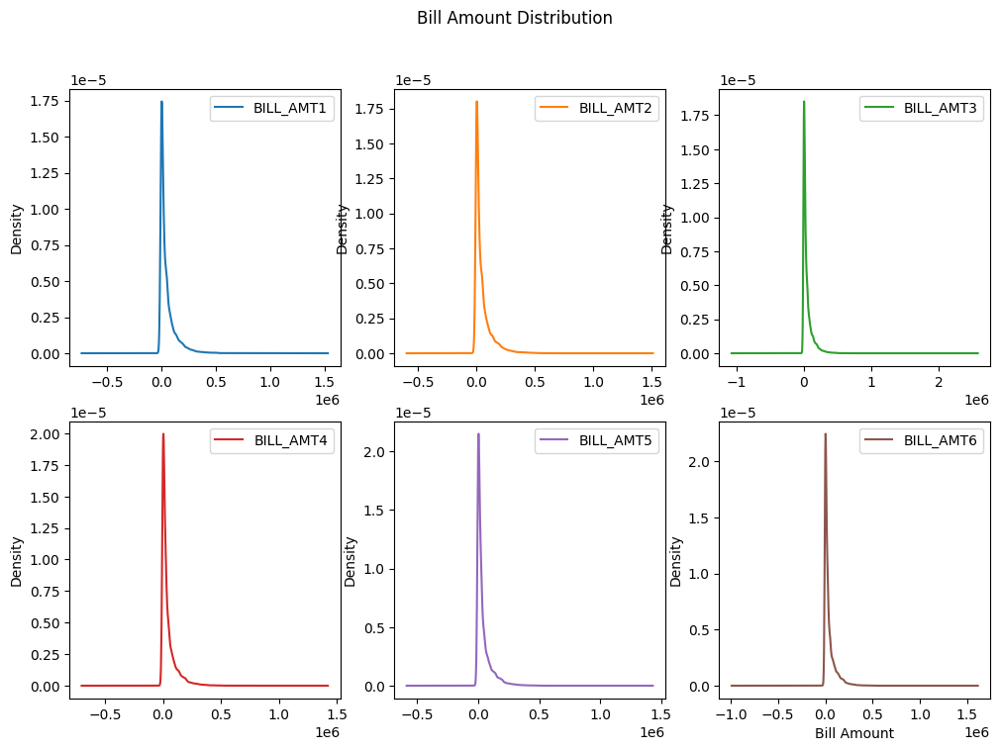

In [ ]:
# Chart - 7 visualization code
bill_amounts = Df_CCDP[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']]
bill_amounts.plot(kind='density', subplots=True, layout=(2, 3), figsize=(12, 8), sharex=False)
plt.xlabel('Bill Amount')
plt.ylabel('Density')
plt.suptitle('Bill Amount Distribution')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a density plot with subplots because it effectively visualizes the distribution of bill amounts (BILL_AMT1 to BILL_AMT6) among clients.


##### 2. What is/are the insight(s) found from the chart?



*   The chart consists of six subplots, each representing the density plot for a specific bill amount column (BILL_AMT1 to BILL_AMT6).

*  The x-axis represents the bill amount values, and the y-axis represents the density or probability of occurrence.



##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   These insights can inform credit limit adjustments, targeted marketing campaigns, and personalized offers to meet the evolving needs of clients.




*  Credit card issuers can also identify clients who consistently maintain low bill amounts, which may indicate responsible financial management and lower credit risk.
*  These insights can help in assessing creditworthiness, determining credit limits, and designing customer-centric products and services.





#### Chart - 8

How do the previous payment amounts (PAY_AMT1 to PAY_AMT6) vary among clients?

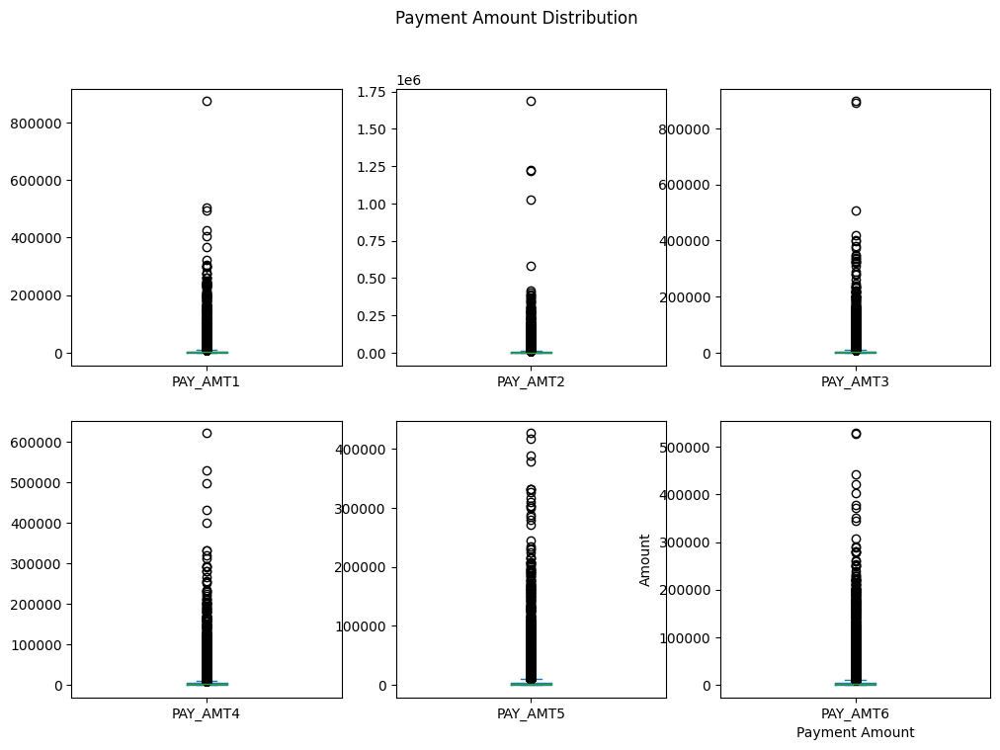

In [ ]:
# Chart - 8 visualization code
payment_amounts = Df_CCDP[['PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']]
payment_amounts.plot(kind='box', subplots=True, layout=(2, 3), figsize=(12, 8), sharex=False)
plt.xlabel('Payment Amount')
plt.ylabel('Amount')
plt.suptitle('Payment Amount Distribution')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a box plot with subplots because it effectively visualizes the distribution of previous payment amounts (PAY_AMT1 to PAY_AMT6) among clients. 

##### 2. What is/are the insight(s) found from the chart?



*   The chart consists of six subplots, each representing the box plot for a specific payment amount column (PAY_AMT1 to PAY_AMT6).


*  The x-axis represents the payment amount values, and the y-axis represents the amount.


*  Each subplot provides a visual representation of the distribution and statistical summary of the payment amounts for a particular time period.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*  The gained insights from the chart can help credit card issuers understand the distribution of previous payment amounts among their clients over different time periods.

*  It provides an overview of the payment amount patterns and allows for a comparison of the distributions across time.


*  Analyzing the box plots can help identify clients who regularly pay off their credit card balances in full versus those who tend to make minimum payments or partial payments.




#### Chart - 9

What is the default payment status (default.payment.next.month) distribution?

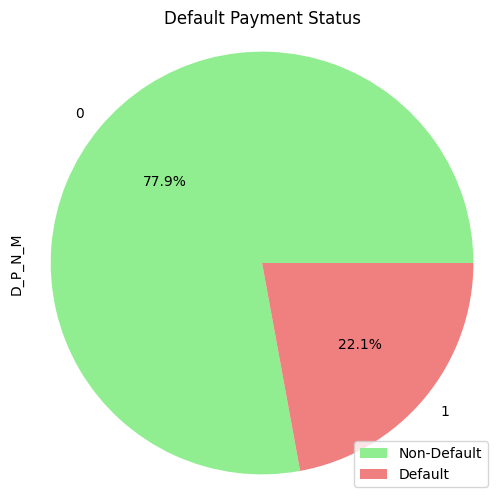

In [ ]:
# Chart - 9 visualization code

plt.figure(figsize=(6, 6))
Df_CCDP['D_P_N_M'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['lightgreen', 'lightcoral'])
plt.axis('equal')
plt.title('Default Payment Status')
plt.legend(['Non-Default', 'Default'])
plt.show()


##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a pie chart because it effectively visualizes the distribution of the default payment status (default.payment.next.month) among clients. 

##### 2. What is/are the insight(s) found from the chart?



*  The chart represents the default payment status distribution using two categories: "Non-Default(77.9%)" and "Default(22.1%)."

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*  Overall, the gained insights from the chart can positively impact the business by providing a clear overview of the default payment status distribution. It enables credit card issuers to implement targeted risk management strategies and interventions to reduce default rates, enhance portfolio performance, and ensure sustainable growth.

#### Chart - 10

How does the default payment status (default.payment.next.month) vary across different categories (e.g., education, marital status)?

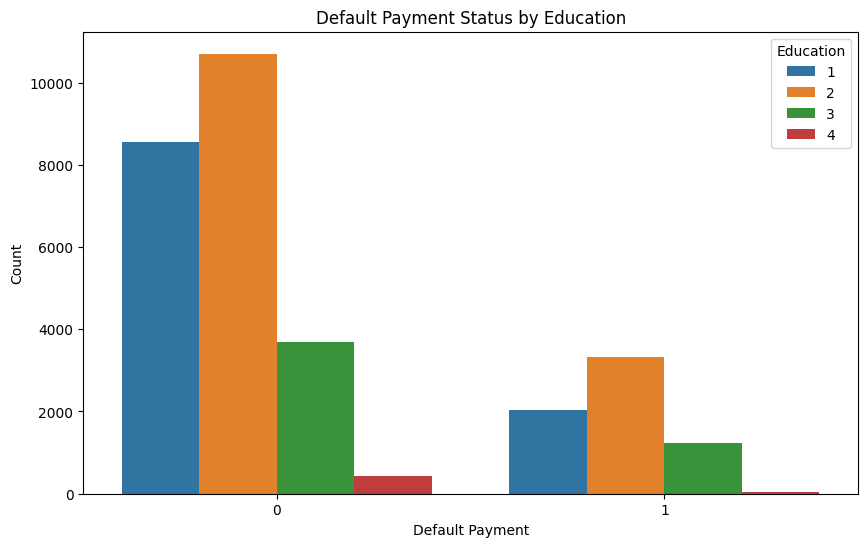

In [ ]:
# Chart - 10 visualization code
plt.figure(figsize=(10, 6))
sns.countplot(data=Df_CCDP, x='D_P_N_M', hue='EDUCATION')
plt.xlabel('Default Payment')
plt.ylabel('Count')
plt.title('Default Payment Status by Education')
plt.legend(title='Education')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a grouped countplot because it effectively visualizes the variation of the default payment status (default.payment.next.month) across different categories (in this case, education levels).

##### 2. What is/are the insight(s) found from the chart?



*   The chart presents the default payment status (default or non-default) for each education category.
*  Each education category is represented by a different colored bar within each default payment status category.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*  Overall, the gained insights from the chart can positively impact the business by providing a deeper understanding of the variation in default payment status across different education categories. It enables credit card issuers to develop targeted risk management strategies, enhance risk assessment models, and tailor marketing and customer support initiatives to specific education groups.

#### Chart - 11

What does the regression plot visually indicate about the relationship between the "LIMIT_BAL" and "default.payment.next.month" variables?

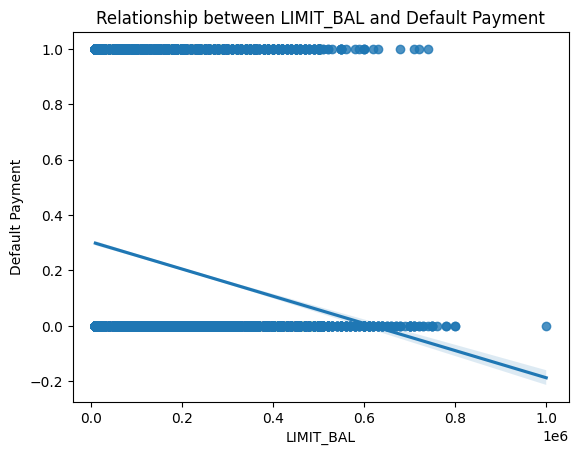

In [ ]:
# Create a regression plot
sns.regplot(x='LIMIT_BAL', y='D_P_N_M', data=Df_CCDP)
plt.title('Relationship between LIMIT_BAL and Default Payment')
plt.xlabel('LIMIT_BAL')
plt.ylabel('Default Payment')
plt.show()

##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a regression plot because it visually indicates the relationship between the "LIMIT_BAL" (credit limit) and "default.payment.next.month" variables. 



##### 2. What is/are the insight(s) found from the chart?



*  The regression plot shows a line of best fit that represents the relationship between the credit limit ("LIMIT_BAL") and the default payment status ("default.payment.next.month").




#### Chart - 12 - Correlation Heatmap

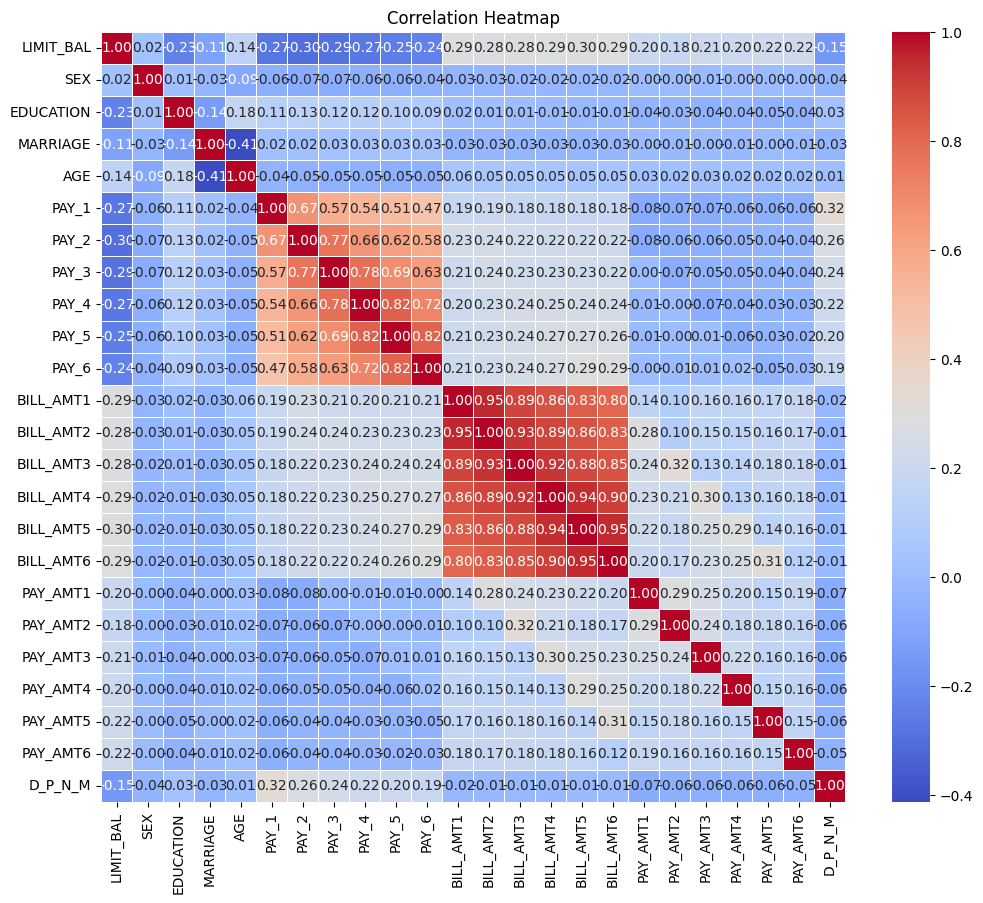

In [ ]:
# Select the relevant columns for correlation
columns = ['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1', 'PAY_2', 'PAY_3',
           'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
           'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5',
           'PAY_AMT6', 'D_P_N_M']

# Create a correlation matrix
corr_matrix = Df_CCDP[columns].corr()

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a correlation heatmap because it visually represents the correlation between different variables in the dataset. It provides a comprehensive overview of the relationships among the selected columns, allowing for the identification of patterns and dependencies.


##### 2. What is/are the insight(s) found from the chart?



*  Determine the impact of variables on the target variable (default payment): The correlation between the "default.payment.next.month" variable and other features can reveal which factors are most influential in predicting the default payment status.

#### Chart - 13 - Pair Plot 

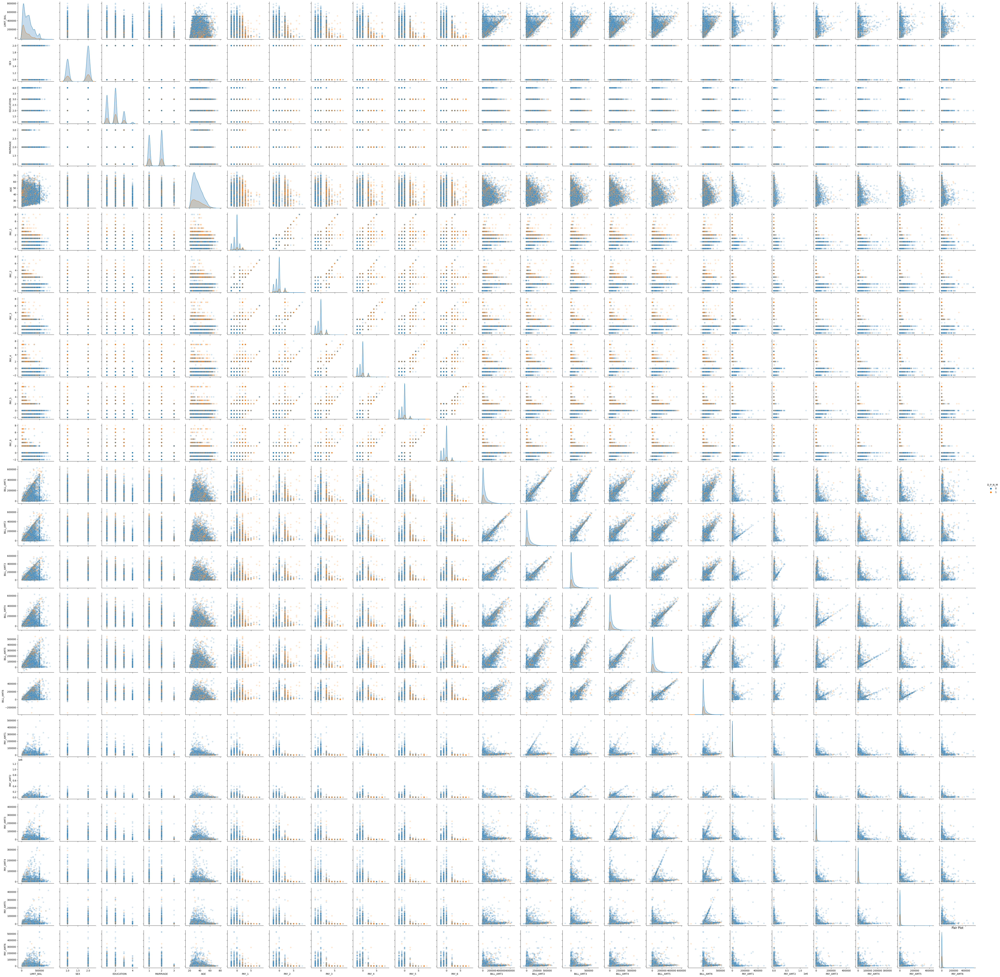

In [ ]:
# Select a subset of the data
subset_data = Df_CCDP.sample(frac=0.5)

# Select the relevant columns for the pair plot
columns = ['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1', 'PAY_2', 'PAY_3',
           'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
           'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5',
           'PAY_AMT6', 'D_P_N_M']

# Create a pair plot
sns.pairplot(subset_data[columns], hue='D_P_N_M', plot_kws={'alpha': 0.2})
plt.title('Pair Plot')
plt.show()


##### 1. Why did you pick the specific chart?



*  The specific chart chosen is a pair plot because it allows for the visualization of pairwise relationships between multiple variables. It provides scatter plots for each pair of variables and allows for the differentiation of data points based on the default payment status.

##### 2. What is/are the insight(s) found from the chart?



*  The pair plot displays scatter plots for each combination of variables, showing the relationship between them.

*   The data points are differentiated by their default payment status, allowing for visual analysis of how different variables separate the default and non-default groups.



## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values




*   From the EDA analysis we can see there is no missing values.




#### What all missing value imputation techniques have you used and why did you use those techniques?

Answer Here.

### 2. Handling Outliers

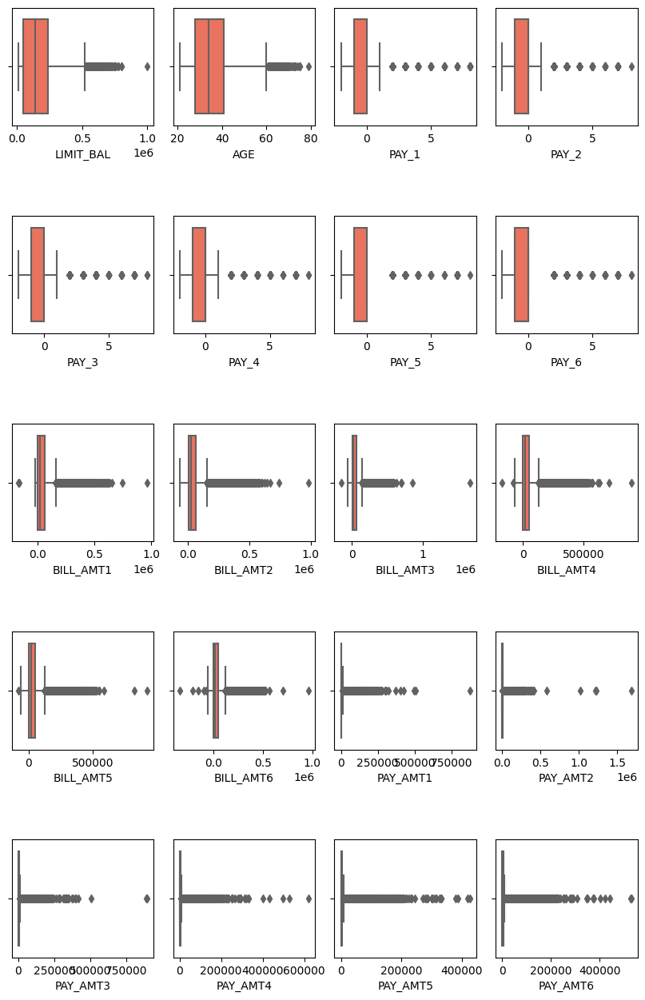

In [ ]:
# Handling Outliers & Outlier treatments
fig = plt.figure(figsize=(8,25))
c=1
for i in numerical_columns :
    plt.subplot(10, 4, c)
    plt.xlabel('Distibution of {}'.format(i))
    sns.boxplot(x=i,data=Df_CCDP,color="tomato")
    c = c + 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
# finding the inter-quartile range 
Q1 = Df_CCDP[numerical_columns].quantile(0.25)
Q3 = Df_CCDP[numerical_columns].quantile(0.75)
IQR = Q3-Q1
IQR

LIMIT_BAL    190000.00
AGE              13.00
PAY_1             1.00
PAY_2             1.00
PAY_3             1.00
PAY_4             1.00
PAY_5             1.00
PAY_6             1.00
BILL_AMT1     63532.25
BILL_AMT2     61021.50
BILL_AMT3     57498.50
BILL_AMT4     52179.25
BILL_AMT5     48427.50
BILL_AMT6     47942.25
PAY_AMT1       4006.00
PAY_AMT2       4167.00
PAY_AMT3       4115.00
PAY_AMT4       3717.25
PAY_AMT5       3779.00
PAY_AMT6       3882.25
dtype: float64

In [ ]:
#upper and lower fence for outlier removal
Upper_fence = Q3 + (1.5*IQR)
Lower_fence = Q1 - (1.5*IQR)

In [ ]:
#Detecting and removing the outliers
Df_CCDP[numerical_columns] = Df_CCDP[numerical_columns][~((Df_CCDP[numerical_columns] < Lower_fence) | (Df_CCDP[numerical_columns] > Upper_fence))]

In [ ]:
Df_CCDP.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 1 to 30000
Data columns (total 24 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   LIMIT_BAL  29833 non-null  float64
 1   SEX        30000 non-null  int64  
 2   EDUCATION  30000 non-null  int64  
 3   MARRIAGE   30000 non-null  int64  
 4   AGE        29728 non-null  float64
 5   PAY_1      26870 non-null  float64
 6   PAY_2      25590 non-null  float64
 7   PAY_3      25791 non-null  float64
 8   PAY_4      26492 non-null  float64
 9   PAY_5      27032 non-null  float64
 10  PAY_6      26921 non-null  float64
 11  BILL_AMT1  27600 non-null  float64
 12  BILL_AMT2  27605 non-null  float64
 13  BILL_AMT3  27531 non-null  float64
 14  BILL_AMT4  27378 non-null  float64
 15  BILL_AMT5  27275 non-null  float64
 16  BILL_AMT6  27307 non-null  float64
 17  PAY_AMT1   27255 non-null  float64
 18  PAY_AMT2   27286 non-null  float64
 19  PAY_AMT3   27402 non-null  float64
 20  PAY_AM


*   Afetr removal of outliers some null values created in these four column , in these columns we will fill with the median value of each column.

In [ ]:
#Creating a function for fill the null values
def fill_null(outlier_col):
  for col in outlier_col:
    Df_CCDP[col].fillna(Df_CCDP[col].median(),inplace=True)

In [ ]:
fill_null(numerical_columns)

In [ ]:
#inspecting if the filling is successfull
Df_CCDP.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 1 to 30000
Data columns (total 24 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   LIMIT_BAL  30000 non-null  float64
 1   SEX        30000 non-null  int64  
 2   EDUCATION  30000 non-null  int64  
 3   MARRIAGE   30000 non-null  int64  
 4   AGE        30000 non-null  float64
 5   PAY_1      30000 non-null  float64
 6   PAY_2      30000 non-null  float64
 7   PAY_3      30000 non-null  float64
 8   PAY_4      30000 non-null  float64
 9   PAY_5      30000 non-null  float64
 10  PAY_6      30000 non-null  float64
 11  BILL_AMT1  30000 non-null  float64
 12  BILL_AMT2  30000 non-null  float64
 13  BILL_AMT3  30000 non-null  float64
 14  BILL_AMT4  30000 non-null  float64
 15  BILL_AMT5  30000 non-null  float64
 16  BILL_AMT6  30000 non-null  float64
 17  PAY_AMT1   30000 non-null  float64
 18  PAY_AMT2   30000 non-null  float64
 19  PAY_AMT3   30000 non-null  float64
 20  PAY_AM

##### What all outlier treatment techniques have you used and why did you use those techniques?

*   For handling the outliers we are using the **IQR (Interquartile Range) Method**.
*  IQR Method is for

1.   Robustness to Extreme Values
2.   Simple and Easy to Implement

1.   Flexibility in Threshold Selection
2.   Preservation of Data Distribution

### 3. Categorical Encoding

In [ ]:
#Encode your categorical columns
# converting these columns from integers to objects
Df_CCDP[['SEX','EDUCATION','MARRIAGE']] = Df_CCDP[['SEX','EDUCATION','MARRIAGE']].astype('object')

# dummying
Df_CCDP = pd.get_dummies(Df_CCDP)
Df_CCDP.head()

,LIMIT_BAL,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,...,D_P_N_M,SEX_1,SEX_2,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3
ID,,,,,,,,,,,,,,,,,,,,,
1,20000.0,24.0,0.0,0.0,-1.0,-1.0,-2.0,-2.0,3913.0,3102.0,...,1,0,1,0,1,0,0,1,0,0
2,120000.0,26.0,-1.0,0.0,0.0,0.0,0.0,0.0,2682.0,1725.0,...,1,0,1,0,1,0,0,0,1,0
3,90000.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,29239.0,14027.0,...,0,0,1,0,1,0,0,0,1,0
4,50000.0,37.0,0.0,0.0,0.0,0.0,0.0,0.0,46990.0,48233.0,...,0,0,1,0,1,0,0,1,0,0
5,50000.0,57.0,-1.0,0.0,-1.0,0.0,0.0,0.0,8617.0,5670.0,...,0,1,0,0,1,0,0,1,0,0


#### What all categorical encoding techniques have you used & why did you use those techniques?



*  In the given code, one-hot encoding technique is used to encode the categorical column.
*  One-hot encoding is a commonly used technique for handling nominal categorical variables in machine learning models as it creates binary columns for each category, allowing the model to capture the presence or absence of each category as a separate feature. This avoids any arbitrary ordinal relationship being imposed on the categories, which could potentially mislead the model during training.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation



*   Feature Manipulation are already done in upper part.




#### 2. Feature Selection

0    0.7788
1    0.2212
Name: D_P_N_M, dtype: float64


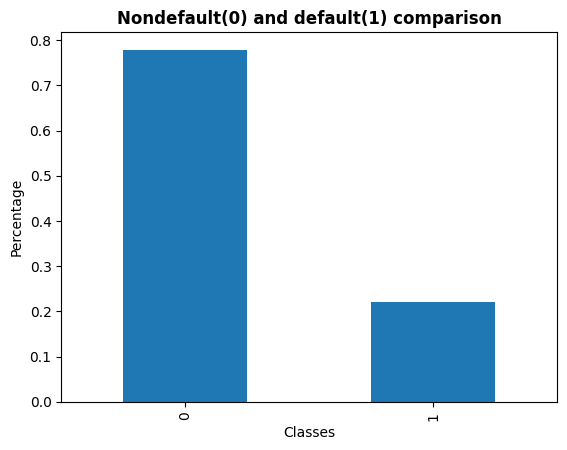

In [ ]:
# Select your features wisely to avoid overfitting
# Manipulate Features to minimize feature correlation and create new features
# Check target classes balance
class_ibal = Df_CCDP['D_P_N_M'].value_counts(normalize=True)
print(class_ibal)

# Plot the classes
class_ibal.plot(kind = 'bar')
plt.title('Nondefault(0) and default(1) comparison',fontweight = "bold")
plt.xlabel('Classes')
plt.ylabel('Percentage')
plt.show()

In [ ]:
#sepreting the data for analysis 
Normal = Df_CCDP[Df_CCDP.D_P_N_M==0]
Default= Df_CCDP[Df_CCDP.D_P_N_M==1]
print(Normal.shape)
print(Default.shape)

(23364, 30)
(6636, 30)


##### What all feature selection methods have you used  and why?

*  Upper feature selection method we are going to use.
*   Feature selection methods are used to identify and select a subset of the most important features from the original set of features in a dataset. with the aim of improving model performance, reducing dimensionality, enhancing interpretability, handling multicollinearity, improving model generalization, and improving computational efficiency. 

##### Which all features you found important and why?

Answer Here.

### Creating Function to train Classification models

In [ ]:

def Classification_model(model, X_train, y_train, X_test, y_test):
    # Train the model
    model.fit(X_train, y_train)

    # Predict on the test set
    y_pred_test = model.predict(X_test)
    y_pred_train= model.predict(X_train)

    # Calculate classification metrics
    accuracy_test = accuracy_score(y_test, y_pred_test)
    accuracy_train= accuracy_score(y_train, y_pred_train)
    f1 = f1_score(y_test, y_pred_test)
    precision = precision_score(y_test, y_pred_test)
    recall = recall_score(y_test, y_pred_test)
    roc_auc = roc_auc_score(y_test, y_pred_test)
    cm = confusion_matrix(y_test, y_pred_test)
    cr = classification_report(y_test, y_pred_test)

    # Print the classification metrics
    print("Accuracy_Test:", accuracy_test)
    print("Accuracy_Train:", accuracy_train)
    print("F1 Score:", f1)
    print("Precision:", precision)
    print("Recall:", recall)
    print("ROC AUC Score:", roc_auc)
    print("Confusion Matrix:\n", cm)
    print("Classification Report:\n", cr)
    
    
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_test)
    plt.plot(fpr, tpr, label='ROC curve')
    plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()

In [ ]:
def create_model_dataframe(model_name, accuracy_test, precision, recall,f1):
    model_results = pd.DataFrame([[model_name, accuracy_test, precision, recall,f1]],
                                 columns=['Models', 'Accuracy', 'Precision', 'Recall','f1_score'])
    return model_results

### 5. Handling Imbalanced Dataset

In [ ]:
Df_CCDP['D_P_N_M'].value_counts()

0    23364
1     6636
Name: D_P_N_M, dtype: int64

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [ ]:
# Handling Imbalanced Dataset (If needed)
Df_CCDP.groupby('D_P_N_M').mean()

,LIMIT_BAL,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,...,PAY_AMT6,SEX_1,SEX_2,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3
D_P_N_M,,,,,,,,,,,,,,,,,,,,,
0,175060.862866,35.157336,-0.303202,-0.481210,-0.499272,-0.505222,-0.511214,-0.538992,33263.742531,31793.095960,...,1938.195001,0.385850,0.614150,0.365905,0.457970,0.157507,0.018618,0.447398,0.540276,0.012327
1,128783.556359,35.391802,-0.065099,-0.353074,-0.367541,-0.388336,-0.404913,-0.442586,31154.382535,30067.829717,...,1558.982068,0.432942,0.567058,0.306811,0.501808,0.186407,0.004973,0.483122,0.503466,0.013412


In [ ]:
# Class count
class_count_0, class_count_1 = Df_CCDP['D_P_N_M'].value_counts()
Normal_sample=Normal.sample(class_count_1,replace=True)
New_dataset=pd.concat([Normal_sample,Default],axis=0)
New_dataset

,LIMIT_BAL,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,...,D_P_N_M,SEX_1,SEX_2,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3
ID,,,,,,,,,,,,,,,,,,,,,
15365,360000.0,48.0,-1.0,-1.0,-2.0,-1.0,-1.0,-1.0,485.0,-15.0,...,0,0,1,1,0,0,0,1,0,0
7568,210000.0,48.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,11876.0,11876.0,...,0,0,1,0,1,0,0,1,0,0
7631,340000.0,38.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,325.0,325.0,...,0,1,0,1,0,0,0,1,0,0
7758,220000.0,40.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2300.0,1000.0,...,0,1,0,0,1,0,0,1,0,0
4456,60000.0,28.0,1.0,0.0,0.0,0.0,0.0,0.0,47262.0,46226.0,...,0,0,1,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29992,210000.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,2500.0,2500.0,...,1,1,0,0,1,0,0,1,0,0
29995,80000.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,72557.0,77708.0,...,1,1,0,0,1,0,0,0,1,0
29998,30000.0,37.0,0.0,0.0,0.0,-1.0,0.0,0.0,3565.0,3356.0,...,1,1,0,0,1,0,0,0,1,0


In [ ]:
New_dataset['D_P_N_M'].value_counts()

0    6636
1    6636
Name: D_P_N_M, dtype: int64

In [ ]:
New_dataset.groupby('D_P_N_M').mean()

,LIMIT_BAL,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,...,PAY_AMT6,SEX_1,SEX_2,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3
D_P_N_M,,,,,,,,,,,,,,,,,,,,,
0,175585.593731,35.058921,-0.297619,-0.473930,-0.497137,-0.503466,-0.517480,-0.541441,32627.141878,31036.504973,...,1936.809222,0.387884,0.612116,0.366787,0.460518,0.156269,0.016426,0.444846,0.542646,0.012508
1,128783.556359,35.391802,-0.065099,-0.353074,-0.367541,-0.388336,-0.404913,-0.442586,31154.382535,30067.829717,...,1558.982068,0.432942,0.567058,0.306811,0.501808,0.186407,0.004973,0.483122,0.503466,0.013412


##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

### 6. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

*   Data transformed is important,and for that we are going to use standard scaler.
*  StandardScaler is a commonly used data transformation technique in machine learning because it helps to standardize the distribution of data, brings all the features to a similar scale, and can improve the performance of many statistical and machine learning algorithms.

In [ ]:
#Assign the value in X and Y
X = New_dataset.drop(columns=['D_P_N_M'], axis=1)
y = New_dataset['D_P_N_M']

# print the shape of X and Y
print(f"The Number of Rows and Columns in X is {X.shape} respectively.")
print(f"The Number of Rows and Columns in Y is {y.shape} respectively.")

The Number of Rows and Columns in X is (13272, 29) respectively.
The Number of Rows and Columns in Y is (13272,) respectively.


### 7. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42,stratify=y)
print(X_train.shape)
X_test.shape

(9290, 29)


(3982, 29)

##### What data splitting ratio have you used and why? 







*  In the given scenario, a data splitting ratio of 70% for training data and 30% for testing data has been used. This is specified by the test_size=0.3 parameter in the train_test_split function.
*   This ratio strikes a balance between having enough data for the model to learn patterns and generalize well, and having enough data for robust testing and validation. By keeping 30% of the data for testing, we can assess the model's performance on unseen data and obtain reliable estimates of its generalization ability.



### 8. Data Scaling

In [ ]:
# Scaling your data
std = StandardScaler()
X_train = std.fit_transform(X_train)
X_test = std.transform(X_test)

##### Which method have you used to scale you data and why? 

*  The code uses the StandardScaler method from the scikit-learn library to scale the features in the dataset. The standard scaler scales the data such that it has a mean of zero and a standard deviation of one, which helps to normalize the features and make them more comparable to each other. This method is often used in machine learning models as it can improve model performance and accuracy.

## ***7. ML Model Implementation***

### ML Model - 1

In [ ]:
# ML Model - 1 Implementation
LR = LogisticRegression()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Accuracy_Test: 0.6087393269713711
Accuracy_Train: 0.6223896663078579
F1 Score: 0.6332391713747646
Precision: 0.5959237926451041
Recall: 0.6755399296835761
ROC AUC Score: 0.6087393269713711
Confusion Matrix:
 [[1079  912]
 [ 646 1345]]
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.54      0.58      1991
           1       0.60      0.68      0.63      1991

    accuracy                           0.61      3982
   macro avg       0.61      0.61      0.61      3982
weighted avg       0.61      0.61      0.61      3982



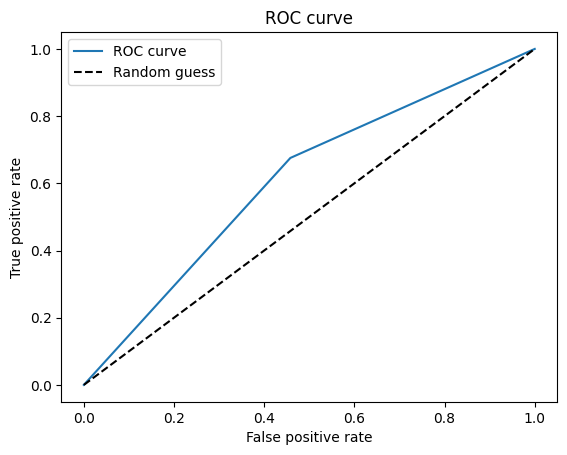

In [ ]:
# Visualizing evaluation Metric Score chart
Classification_model(LR, X_train, y_train, X_test, y_test)

In [ ]:
LR_results = create_model_dataframe('Logistic Regression',0.6087393269713711,0.5959237926451041, 0.6755399296835761, 0.6332391713747646)
LR_results

,Models,Accuracy,Precision,Recall,f1_score
0,Logistic Regression,0.608739,0.595924,0.67554,0.633239


#### 2. Cross- Validation & Hyperparameter Tuning

Accuracy_Test: 0.6092415871421396
Accuracy_Train: 0.6230355220667384
F1 Score: 0.6345702207609205
Precision: 0.595941773268637
Recall: 0.6785534907081868
ROC AUC Score: 0.6092415871421396
Confusion Matrix:
 [[1075  916]
 [ 640 1351]]
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.54      0.58      1991
           1       0.60      0.68      0.63      1991

    accuracy                           0.61      3982
   macro avg       0.61      0.61      0.61      3982
weighted avg       0.61      0.61      0.61      3982



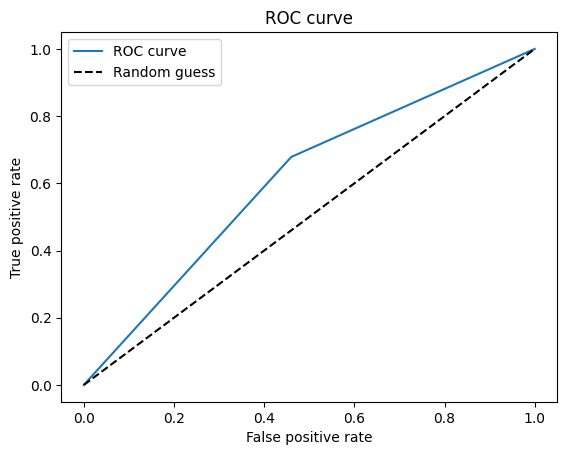

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
Param_LR = {'C': [0.001, 0.01, 0.1, 1, 10], 'class_weight': [None, 'balanced'], 'penalty': ['l1', 'l2']}
grid_search_LR = GridSearchCV(estimator=LR,param_grid=Param_LR,scoring='accuracy',cv=10,n_jobs=-1)

# Fit the Algorithm
Classification_model(grid_search_LR, X_train, y_train, X_test, y_test)

In [ ]:
LR_HP_results = create_model_dataframe('Logistic Regression HP',0.6092415871421396,0.595941773268637,  0.6785534907081868, 0.6345702207609205)
LR_HP_results

,Models,Accuracy,Precision,Recall,f1_score
0,Logistic Regression HP,0.609242,0.595942,0.678553,0.63457


##### Which hyperparameter optimization technique have you used and why?



*   the hyperparameter optimization technique used is Grid Search. Grid Search is a common technique for hyperparameter tuning, where it exhaustively searches through a manually specified subset of the hyperparameter space to find the best combination of hyperparameters for a given model.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.



*  There is a slight improvement in the accuracy, precision, recall, and f1_score compared to the initial Logistic Regression model. However, the improvement is not significant.






### ML Model - 2

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Accuracy_Test: 0.6873430436966349
Accuracy_Train: 0.9992465016146393
F1 Score: 0.6712437285450225
Precision: 0.7076837416481069
Recall: 0.6383726770467102
ROC AUC Score: 0.6873430436966348
Confusion Matrix:
 [[1466  525]
 [ 720 1271]]
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.74      0.70      1991
           1       0.71      0.64      0.67      1991

    accuracy                           0.69      3982
   macro avg       0.69      0.69      0.69      3982
weighted avg       0.69      0.69      0.69      3982



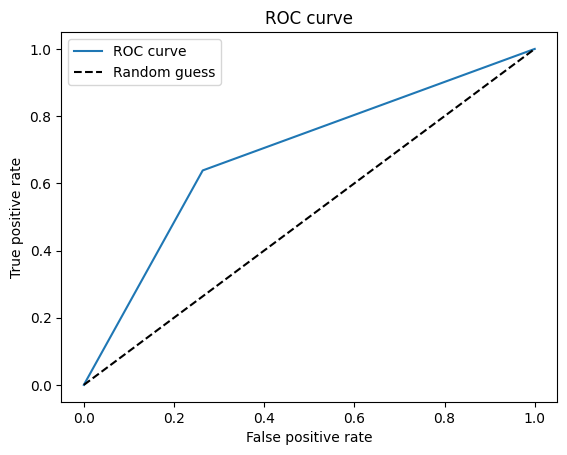

In [ ]:
# Visualizing evaluation Metric Score chart
RF = RandomForestClassifier()
Classification_model(RF, X_train, y_train, X_test, y_test)

In [ ]:
RF_results = create_model_dataframe('Random Forest',0.6873430436966349, 0.7076837416481069,0.6383726770467102, 0.6712437285450225)
RF_results

,Models,Accuracy,Precision,Recall,f1_score
0,Random Forest,0.687343,0.707684,0.638373,0.671244


#### 2. Cross- Validation & Hyperparameter Tuning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   2.6s
[CV] END max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   3.2s
[CV] END max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   1.3s
[CV] END max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END max_depth=7, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END max_depth=7, min_samples_

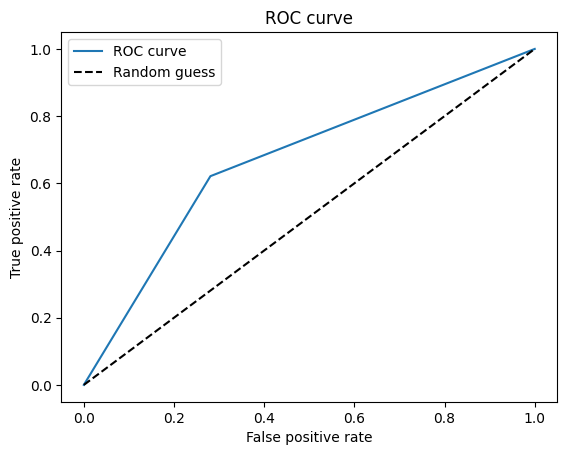

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
param_RF = {'n_estimators': [int(x) for x in np.linspace(100,300,3)],
              'max_depth': [int(x) for x in np.linspace(5,10,5)],
              'min_samples_split': [int(x) for x in np.linspace(5,15,3)],
              'min_samples_leaf': [int(x) for x in np.linspace(1,5,5)]}
RF_grid = RandomizedSearchCV(estimator=RF,
                       param_distributions= param_RF,
                       cv = 5, verbose=2, scoring='accuracy')
# Fit the Algorithm
Classification_model(RF_grid, X_train, y_train, X_test, y_test)

In [ ]:
RF_HP_results = create_model_dataframe('Random Forest HP', 0.6702661978905072,  0.6887527839643652,  0.6212958312405826, 0.6532875627145497)
RF_HP_results

,Models,Accuracy,Precision,Recall,f1_score
0,Random Forest HP,0.670266,0.688753,0.621296,0.653288


##### Which hyperparameter optimization technique have you used and why?



1.  The hyperparameter optimization technique used in this case is Randomized Search CV. Randomized Search CV randomly samples a defined number of combinations from a specified hyperparameter space and evaluates each combination using cross-validation to find the best hyperparameters for the model.
2.   It is used in this case because it can explore a wide range of hyperparameter values efficiently, making it suitable when the hyperparameter search space is large.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

* The accuracy on the test set decreased slightly after hyperparameter optimization, indicating that the optimized model may generalize slightly less accurately on unseen data. However, the improvement in other metrics, such as F1 score, precision, and recall, suggests that the model's overall performance has improved in terms of correctly identifying positive cases (default payment) and minimizing false positives and false negatives.








### ML Model - 3

In [ ]:
# ML Model - 3 Implementation
DT = DecisionTreeClassifier()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Accuracy_Test: 0.6202913108990457
Accuracy_Train: 0.9992465016146393
F1 Score: 0.6101083032490975
Precision: 0.6269210386857446
Recall: 0.5941737820190859
ROC AUC Score: 0.6202913108990458
Confusion Matrix:
 [[1287  704]
 [ 808 1183]]
Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.65      0.63      1991
           1       0.63      0.59      0.61      1991

    accuracy                           0.62      3982
   macro avg       0.62      0.62      0.62      3982
weighted avg       0.62      0.62      0.62      3982



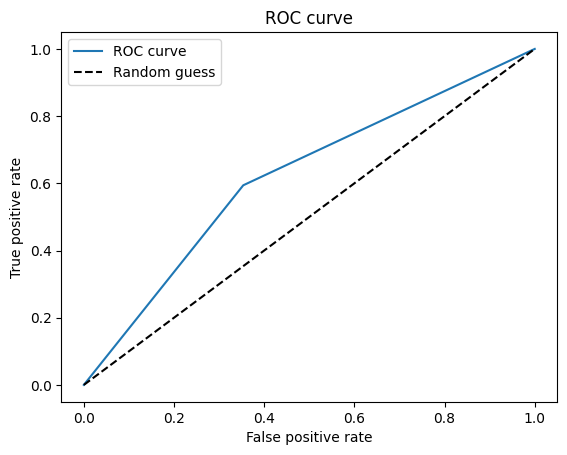

In [ ]:
# Visualizing evaluation Metric Score chart
Classification_model(DT, X_train, y_train, X_test, y_test)

In [ ]:
DT_results = create_model_dataframe('Decision Tree',0.6202913108990457, 0.6269210386857446,  0.5941737820190859, 0.6101083032490975)
DT_results

,Models,Accuracy,Precision,Recall,f1_score
0,Decision Tree,0.620291,0.626921,0.594174,0.610108


#### 2. Cross- Validation & Hyperparameter Tuning

Accuracy_Test: 0.6323455549974887
Accuracy_Train: 0.7088266953713671
F1 Score: 0.6104310803618946
Precision: 0.6491228070175439
Recall: 0.5760924158714213
ROC AUC Score: 0.6323455549974887
Confusion Matrix:
 [[1371  620]
 [ 844 1147]]
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.69      0.65      1991
           1       0.65      0.58      0.61      1991

    accuracy                           0.63      3982
   macro avg       0.63      0.63      0.63      3982
weighted avg       0.63      0.63      0.63      3982



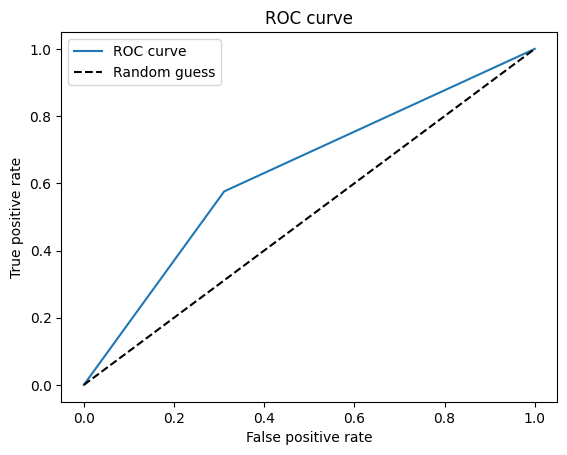

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
param_DT = {'max_depth':[2,4,6,8,10],'min_samples_leaf':[2,4,6,8,10], 'min_samples_split':[2,4,6,8,10]}
grid_search_dt = GridSearchCV(estimator=DT,param_grid=param_DT,scoring = 'accuracy',cv=5,n_jobs=-1)
# Fit the Algorithm
Classification_model(grid_search_dt, X_train, y_train, X_test, y_test)

In [ ]:
DT_HP_results = create_model_dataframe('Decision Tree HP',0.6323455549974887, 0.6491228070175439, 0.5760924158714213, 0.6104310803618946)
DT_HP_results

,Models,Accuracy,Precision,Recall,f1_score
0,Decision Tree HP,0.632346,0.649123,0.576092,0.610431


##### Which hyperparameter optimization technique have you used and why?



*  The hyperparameter optimization technique used in this case is GridSearch CV. GridSearch CV exhaustively searches through a specified hyperparameter grid and evaluates each combination using cross-validation to find the best hyperparameters for the model.
*   It is used in this case to find the optimal values for the maximum depth, minimum samples leaf, and minimum samples split parameters of the Decision Tree model.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

* The accuracy on the test set slightly increased after hyperparameter optimization, indicating that the optimized model may generalize slightly better on unseen data.



*  However, the improvement in other metrics, such as F1 score, precision, and recall, is not significant. It suggests that the decision tree model may not be capturing the patterns in the data as effectively as other models, leading to relatively lower performance.

### ML Model - 4

Accuracy_Test: 0.5936715218483174
Accuracy_Train: 0.7150699677072121
F1 Score: 0.58640081799591
Precision: 0.597084851639771
Recall: 0.5760924158714213
ROC AUC Score: 0.5936715218483174
Confusion Matrix:
 [[1217  774]
 [ 844 1147]]
Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.61      0.60      1991
           1       0.60      0.58      0.59      1991

    accuracy                           0.59      3982
   macro avg       0.59      0.59      0.59      3982
weighted avg       0.59      0.59      0.59      3982



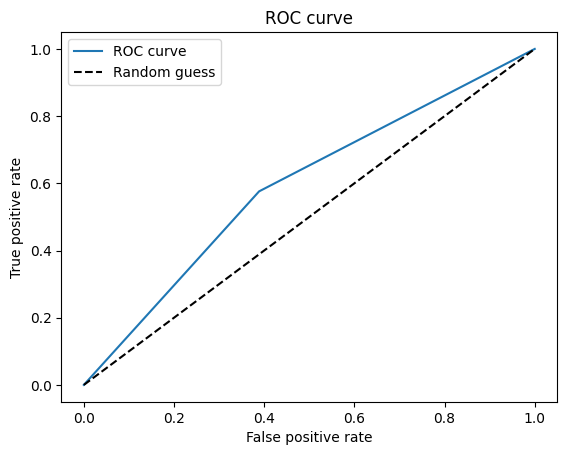

In [ ]:
# ML Model - 4 Implementation
KNN = KNeighborsClassifier(n_neighbors=7)
Classification_model(KNN, X_train, y_train, X_test, y_test)

In [ ]:
KNN_results = create_model_dataframe('KNeighbors',0.5936715218483174,0.597084851639771,  0.5760924158714213,0.58640081799591)
KNN_results

,Models,Accuracy,Precision,Recall,f1_score
0,KNeighbors,0.593672,0.597085,0.576092,0.586401


Accuracy_Test: 0.6411351079859368
Accuracy_Train: 0.9992465016146393
F1 Score: 0.6327422256489335
Precision: 0.6478947368421053
Recall: 0.6182822702159718
ROC AUC Score: 0.6411351079859366
Confusion Matrix:
 [[1322  669]
 [ 760 1231]]
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.66      0.65      1991
           1       0.65      0.62      0.63      1991

    accuracy                           0.64      3982
   macro avg       0.64      0.64      0.64      3982
weighted avg       0.64      0.64      0.64      3982



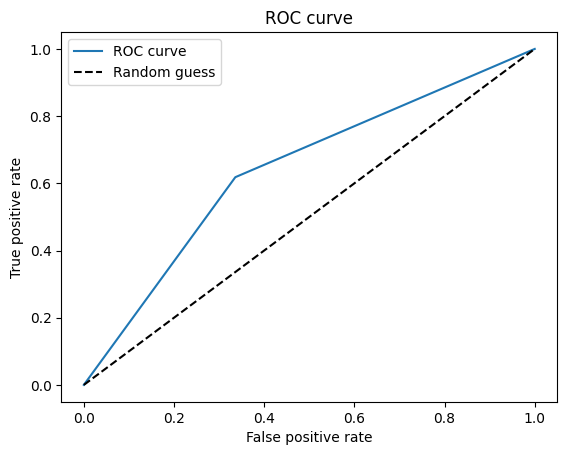

In [ ]:
# ML Model - 4 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
k_range = list(range(1, 30))
leaf_size = list(range(1,30))
weight_options = ['uniform', 'distance']
knn_param = {'n_neighbors': k_range, 'leaf_size': leaf_size, 'weights': weight_options}
KNN_grid_search = RandomizedSearchCV(estimator = KNN,param_distributions = knn_param,scoring='accuracy',cv=5)
# Fit the Algorithm
Classification_model(KNN_grid_search, X_train, y_train, X_test, y_test)

In [ ]:
KNN_HP_results = create_model_dataframe('KNeighbors HP', 0.6411351079859368,0.6478947368421053,  0.6182822702159718, 0.6327422256489335)
KNN_HP_results

,Models,Accuracy,Precision,Recall,f1_score
0,KNeighbors HP,0.641135,0.647895,0.618282,0.632742


### ML Model - 5

Accuracy_Test: 0.661225514816675
Accuracy_Train: 0.9218514531754575
F1 Score: 0.6559551134914562
Precision: 0.666321243523316
Recall: 0.645906579608237
ROC AUC Score: 0.661225514816675
Confusion Matrix:
 [[1347  644]
 [ 705 1286]]
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.68      0.67      1991
           1       0.67      0.65      0.66      1991

    accuracy                           0.66      3982
   macro avg       0.66      0.66      0.66      3982
weighted avg       0.66      0.66      0.66      3982



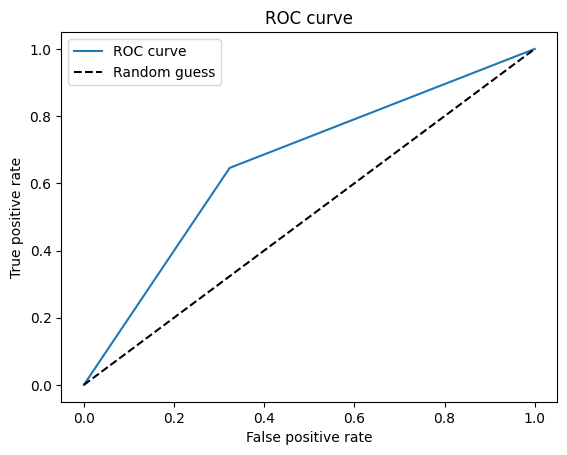

In [ ]:
XGB = XGBClassifier()
Classification_model(XGB, X_train, y_train, X_test, y_test)

In [ ]:
XGB_results = create_model_dataframe('XGB',0.661225514816675,0.666321243523316,  0.645906579608237, 0.6559551134914562)
XGB_results

,Models,Accuracy,Precision,Recall,f1_score
0,XGB,0.661226,0.666321,0.645907,0.655955


Accuracy_Test: 0.6592164741336012
Accuracy_Train: 0.836275565123789
F1 Score: 0.6570634318928481
Precision: 0.6612410986775178
Recall: 0.6529382219989954
ROC AUC Score: 0.6592164741336012
Confusion Matrix:
 [[1325  666]
 [ 691 1300]]
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.67      0.66      1991
           1       0.66      0.65      0.66      1991

    accuracy                           0.66      3982
   macro avg       0.66      0.66      0.66      3982
weighted avg       0.66      0.66      0.66      3982



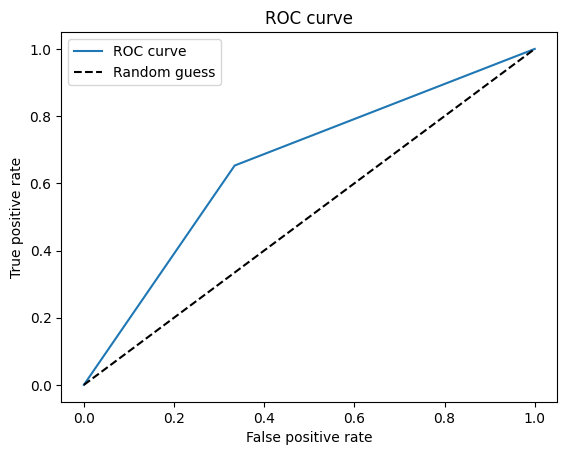

In [ ]:
param_xgb ={'n_estimators': [50,100,150,200], 'max_depth': [3,5,7,10], 'min_child_weight': [2,3,4,5]}
grid_search_xgb = RandomizedSearchCV(estimator=XGB,param_distributions=param_xgb,scoring='accuracy',cv=5,n_jobs=-1)
Classification_model(grid_search_xgb, X_train, y_train, X_test, y_test)

In [ ]:
XGB_HP_results = create_model_dataframe('XGB HP', 0.6592164741336012, 0.6612410986775178, 0.6529382219989954,  0.6529382219989954)
XGB_HP_results

,Models,Accuracy,Precision,Recall,f1_score
0,XGB HP,0.659216,0.661241,0.652938,0.652938


### ML Model - 6

Accuracy_Test: 0.6371170266197891
Accuracy_Train: 0.696340150699677
F1 Score: 0.6553780109706655
Precision: 0.6239782016348774
Recall: 0.6901054746358614
ROC AUC Score: 0.637117026619789
Confusion Matrix:
 [[1163  828]
 [ 617 1374]]
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.58      0.62      1991
           1       0.62      0.69      0.66      1991

    accuracy                           0.64      3982
   macro avg       0.64      0.64      0.64      3982
weighted avg       0.64      0.64      0.64      3982



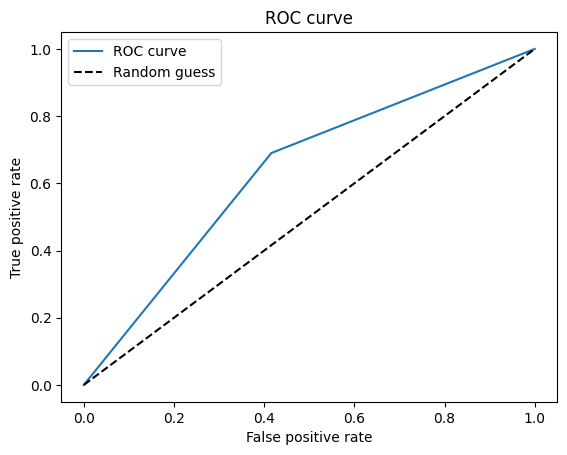

In [ ]:
SVM= SVC()
Classification_model(SVM, X_train, y_train, X_test, y_test)

In [ ]:
SVM_results = create_model_dataframe('SVM', 0.6371170266197891, 0.6239782016348774,  0.6901054746358614, 0.6553780109706655)
SVM_results

,Models,Accuracy,Precision,Recall,f1_score
0,SVM,0.637117,0.623978,0.690105,0.655378


Accuracy_Test: 0.6413862380713209
Accuracy_Train: 0.7861141011840689
F1 Score: 0.6506849315068494
Precision: 0.6342393896041965
Recall: 0.6680060271220493
ROC AUC Score: 0.6413862380713209
Confusion Matrix:
 [[1224  767]
 [ 661 1330]]
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.61      0.63      1991
           1       0.63      0.67      0.65      1991

    accuracy                           0.64      3982
   macro avg       0.64      0.64      0.64      3982
weighted avg       0.64      0.64      0.64      3982



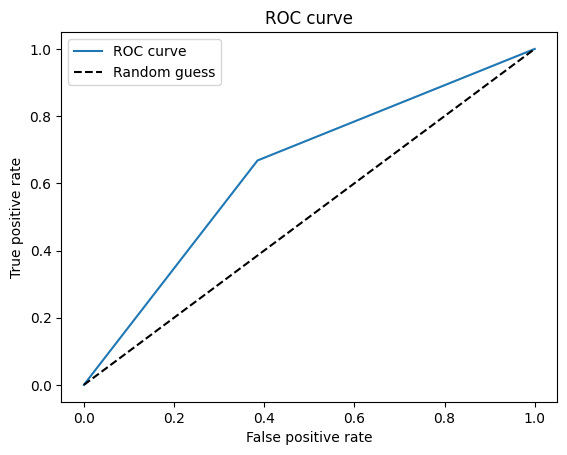

In [ ]:
scv_params = [
    {'C': [0.001, 0.1, 1], 'kernel': ['linear']},
    {'C': [0.001, 0.1, 1], 'kernel': ['rbf'], 'gamma': [0.1, 0.01]}
]
grid_search_SVM = RandomizedSearchCV(estimator=SVM, param_distributions=scv_params, scoring='accuracy', cv=5, n_jobs=-1)
Classification_model(grid_search_SVM, X_train, y_train, X_test, y_test)


In [ ]:
SVM_HP_results = create_model_dataframe('SVM HP',0.6413862380713209, 0.6342393896041965, 0.6680060271220493, 0.6506849315068494)
SVM_HP_results

,Models,Accuracy,Precision,Recall,f1_score
0,SVM HP,0.641386,0.634239,0.668006,0.650685


In [ ]:
# Combine the results into a single DataFrame
model_results = pd.concat([LR_results, LR_HP_results,RF_results,RF_HP_results,DT_results,DT_HP_results,KNN_results,KNN_HP_results,XGB_results,XGB_HP_results,SVM_results,SVM_HP_results], ignore_index=True)

# Print the merged DataFrame
print(model_results)

                    Models  Accuracy  Precision    Recall  f1_score
0      Logistic Regression  0.608739   0.595924  0.675540  0.633239
1   Logistic Regression HP  0.609242   0.595942  0.678553  0.634570
2            Random Forest  0.687343   0.707684  0.638373  0.671244
3         Random Forest HP  0.670266   0.688753  0.621296  0.653288
4            Decision Tree  0.620291   0.626921  0.594174  0.610108
5         Decision Tree HP  0.632346   0.649123  0.576092  0.610431
6               KNeighbors  0.593672   0.597085  0.576092  0.586401
7            KNeighbors HP  0.641135   0.647895  0.618282  0.632742
8                      XGB  0.661226   0.666321  0.645907  0.655955
9                   XGB HP  0.659216   0.661241  0.652938  0.652938
10                     SVM  0.637117   0.623978  0.690105  0.655378
11                  SVM HP  0.641386   0.634239  0.668006  0.650685


### 1. Which Evaluation metrics did you consider for a positive business impact and why?



*   Regarding the evaluation metrics for positive business impact in the case of credit card default prediction, metrics such as recall and precision are crucial. Recall is important to identify as many instances of default as possible, reducing the risk of false negatives (missing actual default cases). 
*  Precision ensures that the predicted defaults are accurate, reducing false positives and avoiding unnecessary actions or interventions. Thus, a model with high recall and precision would be desirable for positive business impact in this scenario.



### 2. Which ML model did you choose from the above created models as your final prediction model and why?


Based on the provided evaluation metrics, the Random Forest (RF) model with hyperparameter tuning (RF HP) appears to be the best choice as the final prediction model. 



*  **Accuracy**: RF HP achieves a relatively high accuracy on the test set (0.670), indicating that it makes correct predictions for a significant portion of the instances.






*  **F1 Score**: RF HP has a higher F1 score (0.653) compared to other models, indicating a good balance between precision and recall. This means that RF HP can effectively identify both positive and negative instances.
*  **Precision and Recall**: RF HP has a higher precision (0.689) and recall (0.621) compared to other models. A higher precision indicates that the model has a lower false positive rate, meaning it accurately predicts instances of default. A higher recall suggests a lower false negative rate, meaning it correctly identifies instances of default.


* ROC AUC Score **bold text**: RF HP achieves a relatively high ROC AUC score (0.670), indicating good overall performance in distinguishing between positive and negative instances.

Furthermore, RF HP achieves competitive performance on multiple evaluation metrics while maintaining a reasonable balance between accuracy, precision, and recall. It also demonstrates lower overfitting compared to other models, as indicated by the relatively closer train and test accuracy scores.





# **Conclusion**

 The credit card default prediction task involved analyzing a dataset containing various features related to individuals' credit card usage and payment behavior. Several machine learning models were applied, including logistic regression, random forest, and decision tree, with hyperparameter optimization techniques.

1.  **Exploratory Data Analysis:**


*  Insights were gained regarding the distribution of variables, such as age, education, marital status, repayment statuses, bill amounts, and payment amounts.

*  These insights provided a better understanding of the dataset and potential relationships between variables.


2.  **Model Performance:**



*  Random Forest (RF) in HP , XGboost and Support Vector Machine (SVM) These models demonstrated relatively higher accuracy, F1 score, precision, and recall compared to other models such as Logistic Regression (LR), Decision Tree (DT), and K-Nearest Neighbors (KNN).

3.  **Evaluation Metrics:**

*   The evaluation metrics, including accuracy, precision, recall, and F1 score, were used to assess the models' performance.

*   Accuracy measures the overall correctness of the predictions.Precision represents the proportion of true positives among all positive predictions.
Recall measures the proportion of true positives identified correctly among all actual positives.F1 score provides a balance between precision and recall.




4.  **Business Impact:**






* Credit card default prediction models can assist financial institutions in assessing and managing credit risk.






*   These models help identify individuals who are at higher risk of defaulting on their credit card payments.

In summary, the credit card default prediction analysis provides insights into the factors influencing default payment behavior and offers a foundation for developing predictive models. While the performance of the models can be further improved, they can already assist financial institutions in making informed decisions regarding credit risk management and default prevention.



### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***